# Dimensionality reduction with UMAP
In the previous checkpoint, we presented a very successful dimensionality reduction algorithm. Actually, since 2008 when t-SNE algorithm was proposed, many data science practitioners welcomed it and it gained popularity especially in the exploratory data analysis tasks. However, as we mentioned before, running t-SNE on large datasets requires too much time and computer resources. This is cumbersome if we're doing research and prototyping as we need to try many different things as fast as possible.

In this checkpoint, we present an alternative to t-SNE which is called **Uniform Manifold Approximation and Projection (in short UMAP)**. UMAP's success in producing low-dimensional representations is on par with that of t-SNE's but UMAP runs much faster than t-SNE which makes it a good choice particularly when researching and prototyping. Moreover, UMAP is also suitable for feature engineering when we need to reduce the dimension of our data. t-SNE again suffers from long computational time when applied on very high dimensional data.

So, let's start with defining UMAP:

# What is UMAP?
Uniform Manifold Approximation and Projection (UMAP) is a general purpose dimensionality reduction technique that can be used for visualisation similar to t-SNE, but also for general non-linear dimension reduction. In words of the original paper that proposes the algorithm:

>"The UMAP algorithm is competitive with t-SNE for visualization quality, and arguably preserves more of the global structure with superior run time performance. Furthermore, UMAP has no computational restrictions on embedding dimension, making it viable as a general purpose dimension reduction technique for machine learning." - Leland McInnes, John Healy, James Melville, 2018, https://arxiv.org/abs/1802.03426

UMAP is an even more recent algorithm than t-SNE. It's proposed in 2018. Hence, we're talking about a very recent work on dimensionality reduction. **This should give you an idea of how the research is active on unsupervised learning front**. Building upon the insights of t-SNE, UMAP comes with some improvements. Hence, understanding the differences between UMAP and t-SNE would shed light on what UMAP achieves.

# Differences between t-SNE and UMAP
1. Probably the most important improvement that UMAP brings on the table is that it’s faster than t-SNE. The slowness of applying t-SNE on large datasets is a serious concern for those who lack the appropriate time and compute resources. UMAP's speed makes it the default choice when it comes to visualization of high-dimensional complex data like image, text and audio. That being said, we should note that UMAP is still slower than PCA.

2. In practice, t-SNE doesn’t have much use apart from visualization. However, UMAP is a general-purpose dimensionality reduction algorithm that can also be used for feature engineering when a need for reducing the dimensions arises. We can use UMAP wherever we can use PCA.

3. When we were talking about t-SNE, we said that t-SNE preserves the local similarity as well as the global structure. However, t-SNE's success is more on preserving the local similarity. UMAP captures global structure better than t-SNE while it's success in preserving the local similarity is on par with that of t-SNE's.

# UMAP algorithm

UMAP's algorithm is quite involved in terms of math and its mathematical underpinnings are more established than that of t-SNE's. Here, we just give a simplistic overview of the algorithm by skipping the details. If you want to dig into the math of the algorithm, you can refer to [the original paper](https://arxiv.org/abs/1802.03426) or you can read a more easy to follow discussion of the algorithm [here](https://www.math.upenn.edu/~jhansen/2018/05/04/UMAP/).

Let's denote our data points as $x_1,…,x_n$. For each point UMAP finds its k nearest neighbors. Let $\sigma_i$ denotes the diameter of the neighborhood of $x_i$ and let $\rho_i$ denotes the distance from $x_i$ to its nearest neighbor. UMAP constructs a weighted graph from these points by doing the following:

1. For all the points $x_j$ in the k-nearest neighborhood of $x_i$, it defines the weights of the edge from $x_i$ to $x_j$ as $w_i(x_i,x_j)=exp(−(d(x_i,x_j)−\rho_i)/\sigma_i)$. Notice that, according to this definition the weights from $x_i$ to $x_j$ and from $x_j$ to $x_i$ are different. In order to make them equal, UMAP modifies it as this: $w(x_i,x_j)=w_i(x_i,x_j)+w_j(x_j,x_i)−w_i(x_i,x_j)w_j(x_j,x_i)$. 

2. After constructing the weighted graph, UMAP calculates the cross-entropy between two weights $w,w’$ by
$C(w,w′)=\sum\limits_{i \sim j}w(i,j)\log(\frac{w(i,j)}{w′(i,j)})+(1−w(i,j))\log(\frac{1−w(i,j)}{1−w′(i,j)})$.
Here w denotes the weights computed from the original data set and w′ denotes the weights computed from the lower-dimensional representation.

3. UMAP minimizes the total cross-entropy using an optimization method like Stochastic Gradient Descent (SGD). This step is an iterative one and continues until convergence.

# Important points to consider

* UMAP is fast and can handle large datasets with high-dimensional data. This is its core advantage against the t-SNE method. So, if you have a large high-dimensional data and want to visualize it, you should try UMAP first instead of t-SNE. Moreover, UMAP is usually better at preserving the global structure of the data than t-SNE. This means that it can provide a better "big picture" view of your data as well as preserving local neighbor similarities.

* **Hyperparameters**: UMAP supports a wide variety of distance metrics, including cosine and correlation distances. Hence, the quality of the lower-dimensional representation might be affected by the metric used. We should also specify the number of neighbors and the minimum distance parameters when applying UMAP. As usual, the best way to choose values for these hyperparameters is to apply k-fold cross-validation.

# Speed

As we said several times before, UMAP is fast and scales well at handling large high-dimensional data. You may realize in your experiments that UMAP can run even 20 times faster than t-SNE especially on high-dimensional datasets like MNIST. Despite this runtime efficiency UMAP still produces high quality results. 

Among the dimensionality reduction algorithms we cover in this module, PCA is the fastest then comes UMAP. So, if you are very time-constrained or your data isn't too complex, you should start with PCA. But if your data is complex like image, text or audio where non-linear relationship between the observations is the norm, then you should go with UMAP as it's more likely that UMAP would produce better representation of your data than PCA.

# UMAP in action

As of writing this checkpoint, UMAP isn't integrated to the scikit-learn package. So, in order to use it, we need to install it using `pip install umap-learn` from the command line. After the installation, we can use it by `import umap`. This library's api is identical to that of the scikit-learn as we'll see in a moment.

Let's start with importing the libraries we use:

In [2]:
#!pip install umap-learn
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.datasets import fetch_openml
import umap

We load the MNIST data using scikit-learn's `fetch_openml` function.

**Note**: You don't have to use this method to download the MNIST dataset. It's available online [here](http://yann.lecun.com/exdb/mnist/). You can also download the dataset from that link and then load it in your own way. Notice that the dataset in the link is separated into two (as training and test sets), but we use the combined version. You can combine the train and test sets into one or you can just use the train set. The results should look similar to each other.

If you want to use `fetch_openml` function and your version of scikit-learn is older than `0.20`, you can run the following code on the command line to upgrade your installation:

```bash
pip install --upgrade scikit-learn
```

Once you get the required version, you can now load the MNIST data: 

In [3]:
# We load the MNIST dataset below
mnist = fetch_openml('mnist_784', version=1, cache=True)

We select 10000 random subset of the 70000 images just for the sake of comparability with the results of t-SNE. You can run UMAP on the whole dataset and see how fast it can get the results.

In [4]:
np.random.seed(123)

indices = np.random.choice(70000,10000)
X = mnist.data[indices] / 255.0
y = mnist.target[indices]

print(X.shape, y.shape)

(10000, 784) (10000,)


Next, we run the UMAP algorithm. Below we use some values for the hyperparameters of UMAP. In particular, we set `n_neighbors=5, min_dist=0.3, metric='correlation'`. Feel free to experiment on these values.

In [6]:
time_start = time.time()

umap_results = umap.UMAP(n_neighbors=5,
                         min_dist=0.3,
                         metric='correlation').fit_transform(X)

print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

UMAP done! Time elapsed: 7.140939235687256 seconds


We are all set to plot the representations that UMAP came up with. In the figure below, we colored and labeled each data point according to its true digit to help our understanding of how useful UMAP representions are:

In [9]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","grey","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Different digits are separated quite well, even better than t-SNE. We mentioned before that UMAP captures the global structure of the data better than t-SNE. The graph above is a clear example of this argument. If you return back to the previous checkpoint and compare the graph that's plotted using t-SNE's representation, you'll see how well different digits are placed distant from each other.

In addition, we also observe that the data points of the same digits seem to be clustered together as they are in the t-SNE representation. The good news is that UMAP achieved this 7 times faster than t-SNE did!

Now, let's move on to the other scenario where we don't know the true categories of the observations. Below, we plot the same graph above, this time without coloring and labeling:

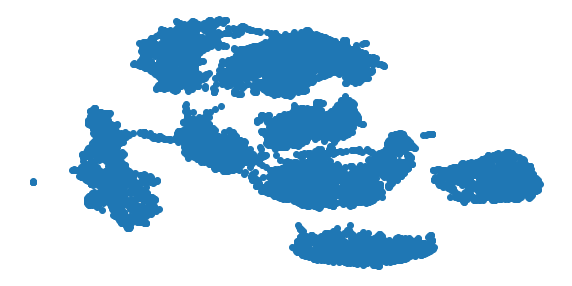

In [10]:
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

We can clearly identify 9 regions in the data. Yet again, 4 and 9 are intertwined each other and seem to be indistinguishable.

# Assignment
In this assignment, you continue working with the [fashion MNIST](https://github.com/zalandoresearch/fashion-mnist) dataset. Use the same sample of size 10000 with the previous checkpoint for the sake of comparability. You can also take a look at these [example solutions](https://github.com/Thinkful-Ed/data-201-resources/blob/master/clustering_module_solutions/9.solution_umap.ipynb).

1. Load the dataset and make your preprocessing like normalizing the data.

In [11]:
mnist_fash = fetch_openml('Fashion-MNIST', version=1, cache=True)

np.random.seed(123)

indices = np.random.choice(70000,10000)
# Normalize the number ranges between 0 and 1 (255 being the max pixel value)
X_fash = mnist_fash.data[indices] / 255
y_fash = mnist_fash.target[indices]

print(X_fash.shape, y_fash.shape)

(10000, 784) (10000,)


2. Apply UMAP to the data.

In [18]:
time_start = time.time()

umap_results = umap.UMAP(n_neighbors=5,
                         min_dist=0.3,
                         metric='correlation').fit_transform(X_fash)

print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

UMAP done! Time elapsed: 7.83353853225708 seconds


3. Using the two-dimensional UMAP representation, draw a graph of the data by coloring and labeling the data points as we did in the checkpoint.

In [19]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","grey","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y_fash[i],
             color=colours[int(y_fash[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

4. Do you think UMAP solution is satisfactory? Can you distinguish between different classes easily? Which one has done a better job: UMAP or the others (t-SNE or PCA) that you applied in the assignments of the previous checkpoints?

> UMAP gives a comparable reduction as t-SNE but stillhas a lot of overlap between classes. Both methods outperform PCA.

5. Now, play with the different hyperparameter values of the UMAP and apply UMAP for each of them. Which combination is the best in terms of the two-dimensional representation clarity?

In [52]:
########################################################################
#########    Creating a function in order to quickly call upon    ######
#########         the reduction with different features  while    ######
#########        cycling through different parameters             ######
########################################################################

def UMAP_RandomSearch(X, n_neighbors=[3, 4, 5],
                         min_dist=np.arange(0.4, 1.0, 0.2),
                         metric=['euclidean','correlation']
                     ):
    umap_hyperparams = dict(
                           n_neighbors=n_neighbors,
                           min_dist=min_dist,
                           metric=metric
                           )

    # Timed for loop...start the clock!
    start_time = time.time()
    for trial in range(5):
        params = dict()
        for k, v in umap_hyperparams.items():
            i = np.random.randint(len(v))
            params[k] = v[i]
        umap_results = umap.UMAP(**params).fit_transform(X)
        
        plt.figure(figsize=(10,5))
        plt.title(f'UMAP - {params}')
        plt.scatter(umap_results[:, 0], umap_results[:, 1])
        plt.xticks([])
        plt.yticks([])
        plt.axis('off')
        plt.show()

        end_time = time.time()
    return f'Execution time: {round(end_time - start_time, 2)} seconds'

/home/uzi/.venv/lib/python3.6/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../.venv/lib/python3.6/site-packages/umap/layouts.py", line 60:

def _optimize_layout_euclidean_single_epoch(
^

  state.func_ir.loc))


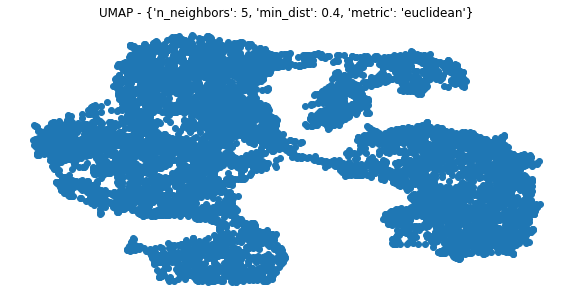

/home/uzi/.venv/lib/python3.6/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../.venv/lib/python3.6/site-packages/umap/layouts.py", line 60:

def _optimize_layout_euclidean_single_epoch(
^

  state.func_ir.loc))


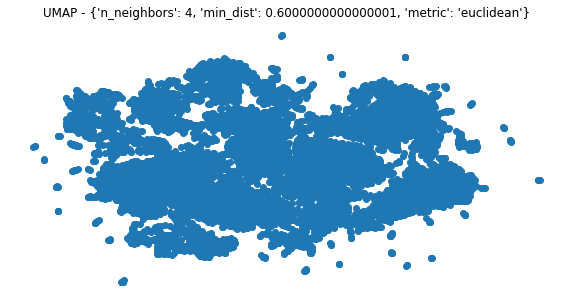

/home/uzi/.venv/lib/python3.6/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../.venv/lib/python3.6/site-packages/umap/layouts.py", line 60:

def _optimize_layout_euclidean_single_epoch(
^

  state.func_ir.loc))


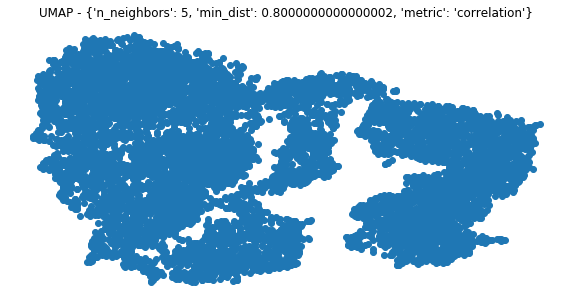

/home/uzi/.venv/lib/python3.6/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../.venv/lib/python3.6/site-packages/umap/layouts.py", line 60:

def _optimize_layout_euclidean_single_epoch(
^

  state.func_ir.loc))


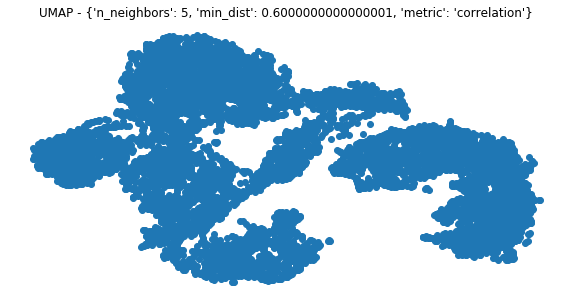

/home/uzi/.venv/lib/python3.6/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../.venv/lib/python3.6/site-packages/umap/layouts.py", line 60:

def _optimize_layout_euclidean_single_epoch(
^

  state.func_ir.loc))


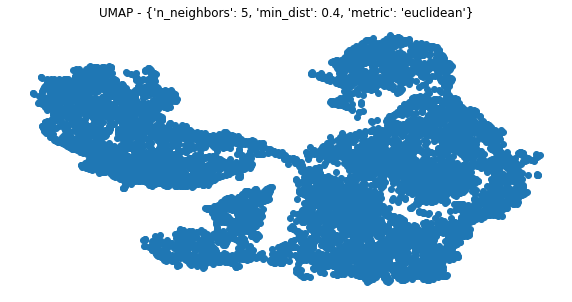

'Execution time: 71.78 seconds'

In [53]:
UMAP_RandomSearch(X_fash)

> From the random search, it would appear as if the n_neighbors=5, min_dist=0.6, metric='correlation combination performed the best.